# Urban Sound Classification


In [ ]:
# Import Modules

import os
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
import librosa.display
import IPython.display as ipd
from tqdm.notebook import tqdm
import pickle

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc, confusion_matrix
import tensorflow as tf
import tensorflow.keras
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPool2D, Dropout, BatchNormalization, Activation, GlobalMaxPooling2D
from tensorflow.keras.utils import to_categorical 

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Extract Data

We will be using the UrbanSound8K dataset created by Justin Salamon, Christopher Jacoby and Juan Pablo Bello of the New York University. The entire credit for the audio files as well as the metadata labeling the files goes to them. To read further about their work and other publications, click this [link](https://urbansounddataset.weebly.com/)


In [ ]:
!wget https://goo.gl/8hY5ER

# Unzip contents to a directory
!tar -zxvf 8hY5ER

Streaming output truncated to the last 5000 lines.
UrbanSound8K/audio/fold4/17480-2-0-9.wav
UrbanSound8K/audio/fold4/175904-2-0-11.wav
UrbanSound8K/audio/fold4/175904-2-0-24.wav
UrbanSound8K/audio/fold4/176003-1-0-0.wav
UrbanSound8K/audio/fold4/176638-5-0-0.wav
UrbanSound8K/audio/fold4/177756-2-0-10.wav
UrbanSound8K/audio/fold4/177756-2-0-4.wav
UrbanSound8K/audio/fold4/177756-2-0-5.wav
UrbanSound8K/audio/fold4/177756-2-0-7.wav
UrbanSound8K/audio/fold4/179862-1-0-0.wav
UrbanSound8K/audio/fold4/180977-3-1-1.wav
UrbanSound8K/audio/fold4/180977-3-1-5.wav
UrbanSound8K/audio/fold4/183989-3-1-21.wav
UrbanSound8K/audio/fold4/183989-3-1-23.wav
UrbanSound8K/audio/fold4/185709-0-0-0.wav
UrbanSound8K/audio/fold4/185709-0-0-1.wav
UrbanSound8K/audio/fold4/185709-0-0-6.wav
UrbanSound8K/audio/fold4/185709-0-0-7.wav
UrbanSound8K/audio/fold4/185909-2-0-102.wav
UrbanSound8K/audio/fold4/185909-2-0-13.wav
UrbanSound8K/audio/fold4/185909-2-0-17.wav
UrbanSound8K/audio/fold4/185909-2-0-34.wav
UrbanSound8K/aud

In [ ]:
# Store the data to Google Drive 
!mv "UrbanSound8K/" "drive/My Drive/Colab Notebooks"

mv: inter-device move failed: 'UrbanSound8K/' to 'drive/My Drive/Colab Notebooks/UrbanSound8K'; unable to remove target: Directory not empty


## Exploratory Data Analysis

We will look at the metadata as well as the sound files. The metadata consists of the class distribution as well as a lookup table to match sound file names with respective classes. 

In [ ]:
# Path to Data
DATA_DIR = "drive/My Drive/Colab Notebooks/UrbanSound8K"
AUDIO_DIR = DATA_DIR + '/audio'

### MetaData

In [ ]:
metadata = pd.read_csv(DATA_DIR+ "/metadata/UrbanSound8K.csv")
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


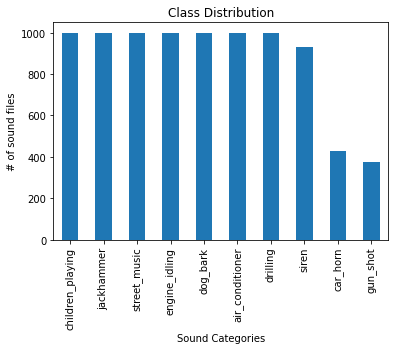

In [ ]:
metadata["class"].value_counts().plot(kind='bar')
plt.ylabel('# of sound files')
plt.xlabel('Sound Categories')
plt.title('Class Distribution')
plt.show()

In [ ]:
# Files per fold
metadata.groupby('fold')['fsID'].count()

fold
1     873
2     888
3     925
4     990
5     936
6     823
7     838
8     806
9     816
10    837
Name: fsID, dtype: int64

In [ ]:
# Class distribution per fold

metadata_pivot = metadata.loc[:,["fold","class"]]
metadata_pivot["count"] = 1
pd.pivot_table(metadata_pivot, index="fold", columns="class",values="count",aggfunc=np.sum)

class,air_conditioner,car_horn,children_playing,dog_bark,drilling,engine_idling,gun_shot,jackhammer,siren,street_music
fold,,,,,,,,,,
1,100,36,100,100,100,96,35,120,86,100
2,100,42,100,100,100,100,35,120,91,100
3,100,43,100,100,100,107,36,120,119,100
4,100,59,100,100,100,107,38,120,166,100
5,100,98,100,100,100,107,40,120,71,100
6,100,28,100,100,100,107,46,68,74,100
7,100,28,100,100,100,106,51,76,77,100
8,100,30,100,100,100,88,30,78,80,100
9,100,32,100,100,100,89,31,82,82,100


### Sound Files


In [ ]:
fold = 1

In [ ]:
# Play the sound files from each class

foldn = metadata[metadata["fold"] == fold]
classes = foldn['class'].unique()
one_of_each = []
for cat in classes:
  one_of_each.append((cat,foldn[foldn["class"] == cat].iloc[random.randint(0,30)]["slice_file_name"]))
for cat, fname in one_of_each:
  print("Category:",cat)
  display(ipd.Audio(AUDIO_DIR + f'/fold{fold}/' + fname))

Category: dog_bark


Category: gun_shot


Category: jackhammer


Category: engine_idling


Category: children_playing


Category: siren


Category: street_music


Category: air_conditioner


Category: drilling


Category: car_horn


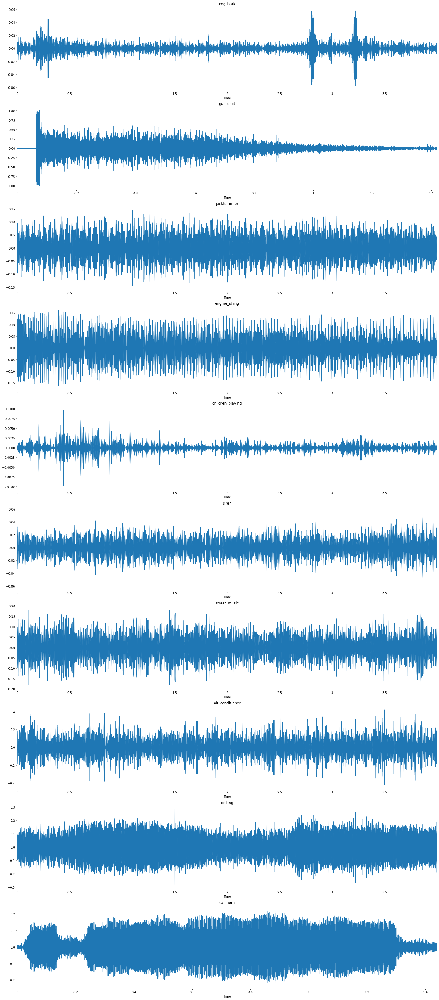

In [ ]:
# Check the amplitude plots
i = 1
fig = plt.figure(figsize=(25,60))
plt.tight_layout()
for cat,fname in one_of_each:
    plt.subplot(10,1,i)
    x,sr = librosa.load(AUDIO_DIR + f'/fold{fold}/' + fname)
    librosa.display.waveplot(x,sr=sr)
    plt.title(cat)
    i += 1
plt.show()

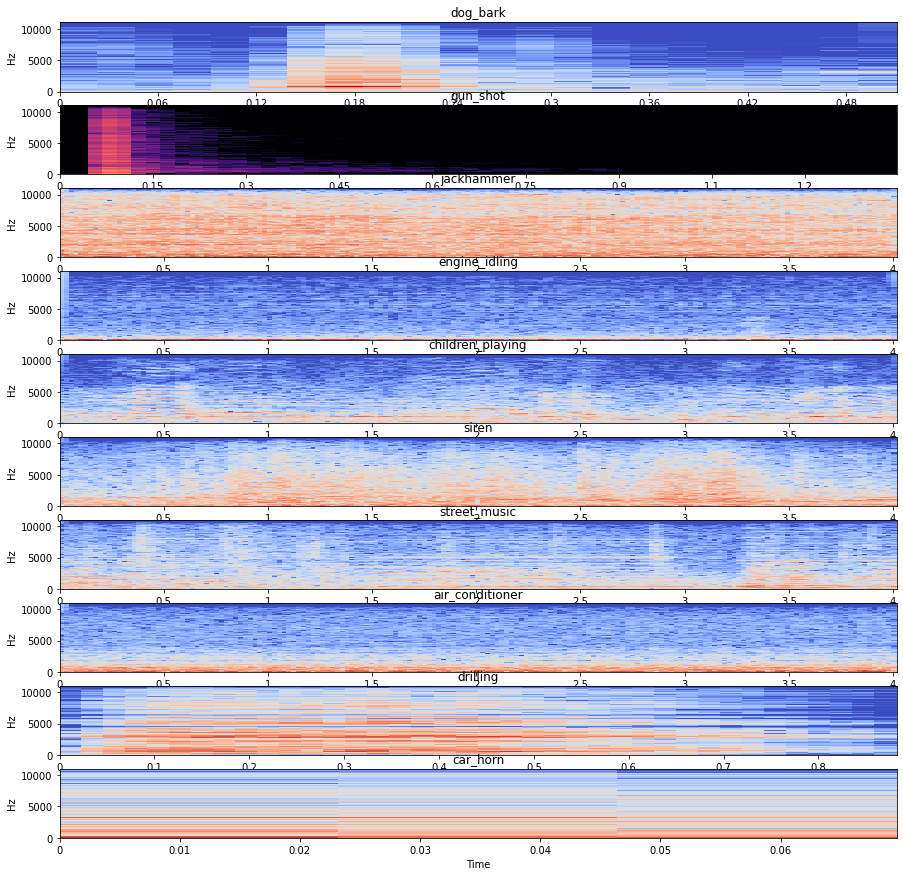

In [ ]:
# Compare the ShortTime Fourier Transforms

i = 1
fig = plt.figure(figsize=(15, 15))
plt.tight_layout()
for cat,fname in one_of_each:
    plt.subplot(10,1,i)
    x,sr = librosa.load(AUDIO_DIR + f'/fold{fold}/' + fname)
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    
    plt.title(cat)
    i += 1
plt.show()

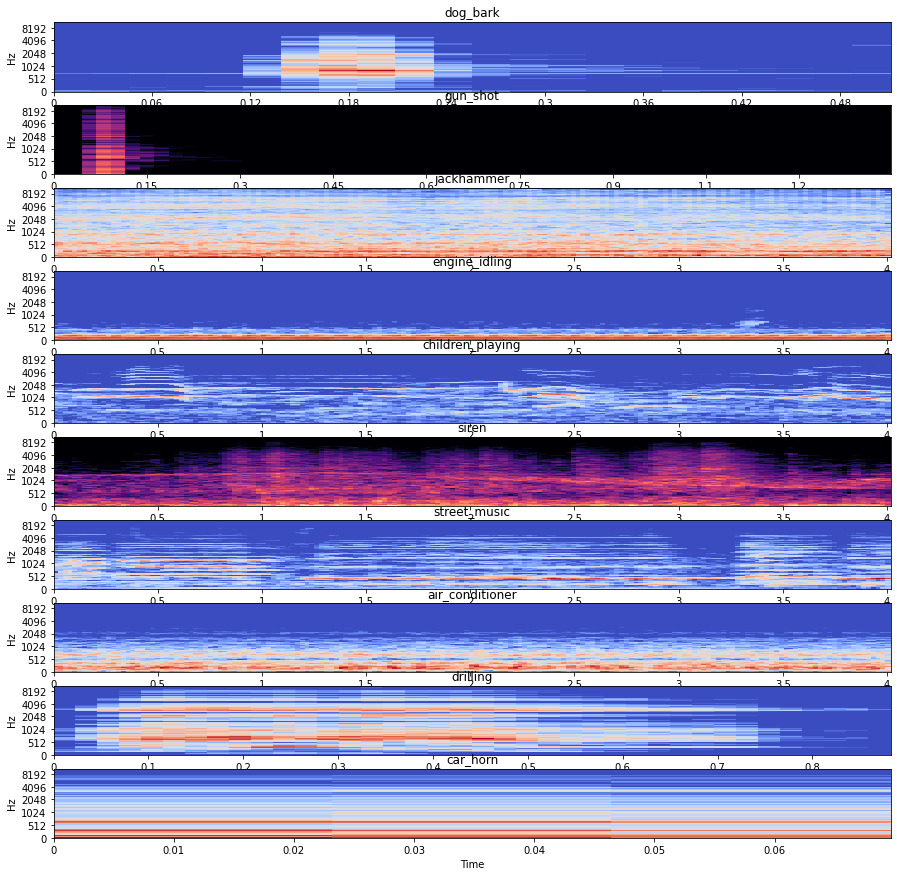

In [ ]:
# Compare the MFCC plots after the melspectrograms

i = 1
fig = plt.figure(figsize=(15, 15))
plt.tight_layout()
for cat,fname in one_of_each:
    plt.subplot(10,1,i)
    x,sr = librosa.load(AUDIO_DIR + f'/fold{fold}/' + fname)
    arr = librosa.feature.melspectrogram(y=x, sr=sr)
    logspec = librosa.amplitude_to_db(arr)
    librosa.display.specshow(logspec, sr=sr, x_axis='time', y_axis='mel')

    plt.title(cat)
    i += 1
plt.show()

## Feature Extraction

Let us use the melspectogram as an input to a Convolutional Neural Network to classify the audio files. We can extract a constant size plot for each audio file (even though they may have different lengths).



In [ ]:
# Extract the MFCC values and use them as training data. ALso extract corresponsing class values

X = []
y = []
for fold in tqdm(range(1,11)):
  fnames = os.listdir(AUDIO_DIR + f'/fold{fold}/')
  for fname in tqdm(fnames):
    try:
      x,sr = librosa.load(AUDIO_DIR + f'/fold{fold}/' + fname)
      arr = librosa.feature.melspectrogram(y=x, sr=sr)
      logspec = librosa.amplitude_to_db(arr)
      logspec = np.mean(logspec.T,axis=0)

      X.append(logspec)
      y.append(metadata[metadata["slice_file_name"] == fname]["class"].values[0])
    except:
      continue

In [ ]:
# Pickle the feautures and labels

with open(DATA_DIR + '/features.pkl', 'wb') as f:
  pickle.dump(X, f)
with open(DATA_DIR + '/labels.pkl', 'wb') as f:
  pickle.dump(y, f)

## Model Building


In [ ]:
# Load the feaures

with open(DATA_DIR + '/features.pkl', 'rb') as f:
  X = pickle.load(f)
with open(DATA_DIR + '/labels.pkl', 'rb') as f:
  y = pickle.load(f)

In [ ]:
# create a map to convert predicted labels back to the actual classes from one-hot encoded arrays

le = LabelEncoder()
y_true = le.fit_transform(y)
label_cvt_dic = {x:y for x,y in set(list(zip(y_true,y)))}
y_one_hot = to_categorical(y_true)

In [ ]:
label_cvt_dic

{0: 'air_conditioner',
 1: 'car_horn',
 2: 'children_playing',
 3: 'dog_bark',
 4: 'drilling',
 5: 'engine_idling',
 6: 'gun_shot',
 7: 'jackhammer',
 8: 'siren',
 9: 'street_music'}

In [ ]:
X = np.array(X)
X = X.reshape(8732, 16, 8, 1)
y = to_categorical(y_true)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state = 1)

In [ ]:
print('Train Features Shape: ', X_train.shape)
print('Train Labels Shape: ', y_train.shape)
print('Test Features Shape: ', X_test.shape)
print('Test Labels Shape: ', y_test.shape)

Train Features Shape:  (6985, 16, 8, 1)
Train Labels Shape:  (6985, 10)
Test Features Shape:  (1747, 16, 8, 1)
Test Labels Shape:  (1747, 10)


### Model 1


In [ ]:
input_shape = (16,8,1)
batch_size = 50
loss_function = tensorflow.keras.losses.categorical_crossentropy
no_classes = 10
no_epochs = 90
learning_rate = 0.001

optimizer = tensorflow.keras.optimizers.Adam(lr=learning_rate)

verbosity = 1

In [ ]:
model = Sequential()
model.add(Conv2D(64, (3, 3), padding = "same", activation = "relu", input_shape = input_shape))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.1))
model.add(Flatten())
model.add(Dense(1024, activation = "relu"))
model.add(Dense(no_classes, activation = "softmax"))

In [ ]:
model.compile(optimizer = optimizer, loss = loss_function, metrics = ['accuracy'])
history = model.fit(X_train, y_train, epochs = no_epochs, batch_size = batch_size, validation_data = (X_test, y_test), verbose=verbosity)

Epoch 1/90
140/140 [==============================] - 6s 46ms/step - loss: 2.4383 - accuracy: 0.2955 - val_loss: 1.6165 - val_accuracy: 0.4465
Epoch 2/90
140/140 [==============================] - 6s 45ms/step - loss: 1.3857 - accuracy: 0.5142 - val_loss: 1.1924 - val_accuracy: 0.5942
Epoch 3/90
140/140 [==============================] - 6s 45ms/step - loss: 1.1497 - accuracy: 0.5920 - val_loss: 1.0209 - val_accuracy: 0.6537
Epoch 4/90
140/140 [==============================] - 6s 44ms/step - loss: 1.0235 - accuracy: 0.6409 - val_loss: 0.9389 - val_accuracy: 0.6869
Epoch 5/90
140/140 [==============================] - 6s 45ms/step - loss: 0.9369 - accuracy: 0.6637 - val_loss: 0.8683 - val_accuracy: 0.7012
Epoch 6/90
140/140 [==============================] - 6s 45ms/step - loss: 0.8748 - accuracy: 0.6923 - val_loss: 0.8092 - val_accuracy: 0.7189
Epoch 7/90
140/140 [==============================] - 6s 45ms/step - loss: 0.8226 - accuracy: 0.7098 - val_loss: 0.8162 - val_accuracy: 0.7172

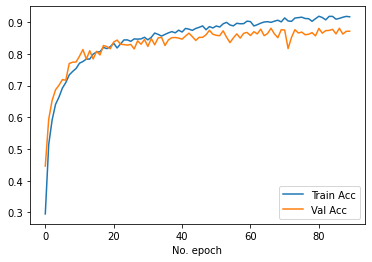

In [ ]:
# Lets Plot the results
plt.plot(history.history['accuracy'],label='Train Acc')
#plt.plot(history.history['loss'], label='Train Loss')
#plt.plot(history.history['val_loss'], label='Val Loss')
plt.plot(history.history['val_accuracy'],label='Val Acc')
plt.legend()
plt.xlabel('No. epoch')
plt.show()

In [ ]:
model.evaluate(X_test,y_test)

55/55 [==============================] - 0s 8ms/step - loss: 0.4434 - accuracy: 0.8718


[0.44336938858032227, 0.8717802166938782]

### Model 2

In [ ]:
input_shape = (16,8,1)
batch_size = 32
loss_function = tensorflow.keras.losses.categorical_crossentropy
no_classes = 10
no_epochs = 500
learning_rate = 0.0001

optimizer = tensorflow.keras.optimizers.Adam(lr=learning_rate)

verbosity = 1

In [ ]:
model2 = Sequential()

model2.add(Conv2D(24, (3, 3), padding = "same", input_shape = input_shape))
model2.add(BatchNormalization())
model2.add(Activation("relu"))
model2.add(MaxPool2D(pool_size=(2, 2)))
model2.add(Dropout(0.3))

model2.add(Conv2D(32, (3, 3), padding = "same"))
model2.add(BatchNormalization())
model2.add(Activation("relu"))
model2.add(MaxPool2D(pool_size=(2, 2)))
model2.add(Dropout(0.3))

model2.add(Conv2D(64, (3, 3), padding = "same"))
model2.add(BatchNormalization())
model2.add(Activation("relu"))
model2.add(MaxPool2D(pool_size=(2, 2)))
model2.add(Dropout(0.1))

model2.add(Conv2D(128, (3, 3), padding = "same"))
model2.add(BatchNormalization())
model2.add(Activation("relu"))
model2.add(Dropout(0.1))

model2.add(Flatten())
model2.add(Dense(256,activation='relu'))
model2.add(Dropout(0.1))
model2.add(Dense(256, activation="relu"))
model2.add(Dropout(0.1))
model2.add(Dense(no_classes, activation="softmax"))

In [ ]:
model2.compile(optimizer = optimizer, loss = loss_function, metrics = ['accuracy'])
history = model2.fit(X_train, y_train, epochs = no_epochs, batch_size = batch_size, validation_split=0.1, verbose=verbosity)

Epoch 1/500
197/197 [==============================] - 3s 16ms/step - loss: 2.2297 - accuracy: 0.1761 - val_loss: 2.1529 - val_accuracy: 0.2904
Epoch 2/500
197/197 [==============================] - 3s 15ms/step - loss: 2.0608 - accuracy: 0.2509 - val_loss: 1.9142 - val_accuracy: 0.3448
Epoch 3/500
197/197 [==============================] - 3s 15ms/step - loss: 1.8891 - accuracy: 0.3093 - val_loss: 1.7328 - val_accuracy: 0.3734
Epoch 4/500
197/197 [==============================] - 3s 16ms/step - loss: 1.7678 - accuracy: 0.3527 - val_loss: 1.7104 - val_accuracy: 0.3805
Epoch 5/500
197/197 [==============================] - 3s 15ms/step - loss: 1.7037 - accuracy: 0.3772 - val_loss: 1.7331 - val_accuracy: 0.3705
Epoch 6/500
197/197 [==============================] - 3s 15ms/step - loss: 1.6357 - accuracy: 0.3968 - val_loss: 1.5376 - val_accuracy: 0.4549
Epoch 7/500
197/197 [==============================] - 3s 15ms/step - loss: 1.5871 - accuracy: 0.4206 - val_loss: 1.5107 - val_accuracy:

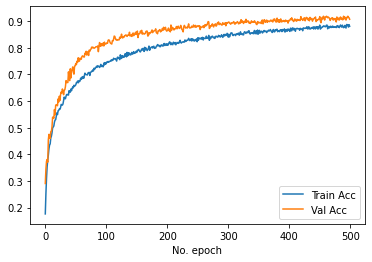

In [ ]:
# Lets Plot the results
plt.plot(history.history['accuracy'],label='Train Acc')
#plt.plot(history.history['loss'], label='Train Loss')
#plt.plot(history.history['val_loss'], label='Val Loss')
plt.plot(history.history['val_accuracy'],label='Val Acc')
plt.legend()
plt.xlabel('No. epoch')
plt.show()

In [ ]:
model2.evaluate(X_test,y_test)

55/55 [==============================] - 0s 4ms/step - loss: 0.3223 - accuracy: 0.8895


[0.322307825088501, 0.8895248770713806]

In [ ]:
y_pred = model2.predict(X_test)

In [ ]:
y_pred_le = np.argmax(y_pred, axis=1)
y_test_le = np.argmax(y_test, axis=1)

In [ ]:
y_pred_le_label = [label_cvt_dic[x] for x in y_pred_le]
y_test_le_label = [label_cvt_dic[x] for x in y_test_le]

In [ ]:
path = DATA_DIR + "/urban_sound_model2"
model2.save(path)

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: drive/My Drive/Colab Notebooks/UrbanSound8K/urban_sound_model2/assets


In [ ]:
model2 = tensorflow.keras.models.load_model(DATA_DIR + "/urban_sound_model2")

In [ ]:
unique_labels = np.unique(y_pred_le_label)
conf_mat = confusion_matrix(y_pred_le_label,y_test_le_label,labels=unique_labels)
df_cm = pd.DataFrame(conf_mat, index = unique_labels, columns = unique_labels)

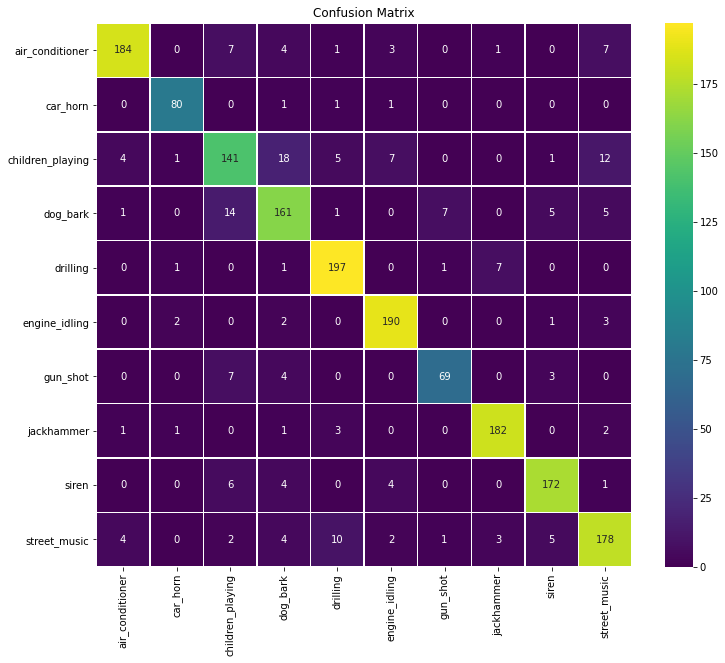

In [ ]:
plt.figure(figsize = (12,10))
plt.title('Confusion Matrix')
sns.heatmap(df_cm, annot=True,fmt="d",cmap='viridis', linewidths=.5)
plt.show()